# How well has the Airbnb market recovered from the onslaught of the COVID-19 pandemic?

##  1 library the basic package

In [295]:
import os
import re
#Data Processing
import numpy as np
import pandas as pd
import geopandas as gpd
pd.set_option('display.max_columns', None)

#Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
import matplotlib.cm as cm
import seaborn as sns

In [296]:
#Maps Visualization
import geopandas as gpd
import folium
from folium import Choropleth

# 2 reading and Writing the data

We're going to start with reading a remote file and saving a local copy.

## 2.1 Read the Remote Data

### data source

http://insideairbnb.com/get-the-data.html

In [297]:
# Set download URL
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/listings.csv.gz'

import pandas as pd
df = pd.read_csv(url, compression='gzip', low_memory=False)

print(f"Data frame is {df.shape[0]:,} x {df.shape[1]}")

Data frame is 67,903 x 74


## 2.2 Describing the Data Frame

In [298]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67903 entries, 0 to 67902
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            67903 non-null  int64  
 1   listing_url                                   67903 non-null  object 
 2   scrape_id                                     67903 non-null  int64  
 3   last_scraped                                  67903 non-null  object 
 4   name                                          67879 non-null  object 
 5   description                                   65388 non-null  object 
 6   neighborhood_overview                         40964 non-null  object 
 7   picture_url                                   67903 non-null  object 
 8   host_id                                       67903 non-null  int64  
 9   host_url                                      67903 non-null 

In [299]:
print(list(df.columns.values))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 

# 3 Save the File Local

In [300]:
import os
path = os.path.join('data','raw')
fn   = url.split('/')[-1]         
print(f"Writing to: {fn}")

Writing to: listings.csv.gz


In [301]:
if not os.path.exists(path):
    print(f"Creating {path} under {os.getcwd()}")
    os.makedirs(path)
    
df.to_csv(os.path.join(path,fn), index=False)
print("Done.")

Done.


# 4 Resetting & Reloading the DataFrame

Let's reload the data simply to make sure we're dealing with the local data set, and also limit the amount of rows and columns we load. We acquired 'cols' by duplicating the output of 'list(df.columns.values)' and then eliminating the fields we weren't interested in.

In [302]:
cols = ['id', 'listing_url', 'last_scraped', 'name', 'description', 'host_id', 'host_name', 'host_since', 
        'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 
        'host_listings_count', 'host_total_listings_count', 'host_verifications','neighbourhood_cleansed', 'latitude', 'longitude', 
        'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 
        'amenities', 'price', 'minimum_nights', 'maximum_nights', 'availability_365', 'number_of_reviews', 
        'first_review', 'last_review', 'review_scores_rating', 'review_scores_cleanliness', 
        'review_scores_checkin', 'review_scores_communication', 'review_scores_location','review_scores_value', 'license', 
        'instant_bookable', 'calculated_host_listings_count', 'reviews_per_month']

In [303]:
df = pd.read_csv(os.path.join(path,fn), usecols=cols,low_memory=False)
print(f"Data frame is {df.shape[0]:,} x {df.shape[1]}")

Data frame is 67,905 x 44


# 5 Dealing with NaNs and Nulls

## 5.1 Identifying Problem Rows

In [304]:
df[df.id.isna()][['id','listing_url','name','description','host_id','host_name']]

,id,listing_url,name,description,host_id,host_name
2834,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/1c171...,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern..."
27351,NaN,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,1.0,"['email', 'phone', 'facebook', 'reviews']"


## 5.2 Counting Nulls by Column

In [305]:
df.isnull().sum(axis=0).sort_values(ascending=False)[:12]

license                        67905
bathrooms                      67903
host_response_rate             34290
host_acceptance_rate           33907
host_about                     30361
review_scores_value            20476
review_scores_location         20472
review_scores_checkin          20471
review_scores_communication    20434
review_scores_cleanliness      20419
reviews_per_month              19032
review_scores_rating           19030
dtype: int64

The most obvious ones here are:license,bathrooms,host_response_rate,host_acceptance_rate.So we just drop them!

In [306]:
df.drop(columns=['bathrooms','license','host_response_rate','host_acceptance_rate','host_about'], inplace=True)

## 5.3 Counting Nulls by Row

In [307]:
df.isnull().sum(axis=1).sort_values(ascending=False)

27350    30
2833     30
53372    19
53371    19
6564     15
         ..
38521     0
38522     0
38523     0
18133     0
0         0
Length: 67905, dtype: int64

<class 'pandas.core.series.Series'>


<AxesSubplot:ylabel='Frequency'>

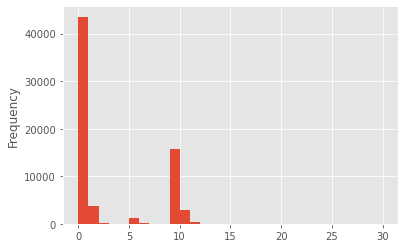

In [308]:
probs = df.isnull().sum(axis=1)
print(type(probs))       # Note that this has returned a series!
probs.plot.hist(bins=30) # Oooooooh, check out what we can do with a series!

Delete rows with null values greater than 7

In [309]:
df.drop(probs[probs > 7].index, inplace=True)

In [310]:
print(f"Have reduced data frame to: {df.shape[0]} rows and {df.shape[1]} columns")

Have reduced data frame to: 48872 rows and 39 columns


# 6 Fixing the Remaining Data Issues

## 6.1 transform string to datetime for the further analysis

In [311]:
dates = ['last_scraped','host_since','first_review','last_review']
df.sample(5, random_state=43)[dates]

,last_scraped,host_since,first_review,last_review
33529,2021-10-13,2014-04-01,2019-04-13,2021-10-09
32807,2021-10-11,2017-01-18,2018-07-04,2018-07-12
49491,2021-10-11,2018-06-11,2019-11-01,2019-11-01
40521,2021-10-11,2015-03-19,2019-06-22,2019-11-18
55667,2021-10-12,2014-02-19,2021-09-12,2021-09-12


In [312]:
for d in dates:
    print("Converting " + d)
    df[d] = pd.to_datetime(df[d], infer_datetime_format=True)

Converting last_scraped
Converting host_since
Converting first_review
Converting last_review


## 6.2 Categories

In [313]:
cats = ['property_type','room_type']
df.sample(5, random_state=43)[cats]

,property_type,room_type
33529,Entire residential home,Entire home/apt
32807,Private room in rental unit,Private room
49491,Private room in residential home,Private room
40521,Private room in rental unit,Private room
55667,Private room in condominium (condo),Private room


In [314]:
for c in cats:
    print(f"Converting {c}")
    df[c] = df[c].astype('category')

Converting property_type
Converting room_type


In [315]:
print(df[cats[1]].cat.categories.values)

['Entire home/apt' 'Hotel room' 'Private room' 'Shared room']


## 6.2 Dealing with Price! 


In [316]:
money = ['price']
df.sample(5, random_state=42)[money]

,price
36166,$85.00
65196,$129.00
25567,$275.00
57009,$120.00
62997,$33.00


In [317]:
for m in money:
    print(f"Converting {m}")
    df[m] = df[m].str.replace('$','').str.replace(',','').astype('float')

Converting price


/tmp/ipykernel_2369/1928573030.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df[m] = df[m].str.replace('$','').str.replace(',','').astype('float')


In [318]:
df.sample(5, random_state=42)[money]

,price
36166,85.0
65196,129.0
25567,275.0
57009,120.0
62997,33.0


## 6.3 dealing with Integers

In [319]:
ints  = ['id','host_id','host_listings_count','host_total_listings_count','accommodates',
         'beds','minimum_nights','maximum_nights','availability_365','calculated_host_listings_count']
for i in ints:
    print(f"Converting {i}")
    try:
        df[i] = df[i].astype('float').astype('int')
    except ValueError as e:
        print("\tConverting to unsigned 16-bit integer.")
        df[i] = df[i].astype('float').astype(pd.UInt16Dtype())

Converting id
Converting host_id
Converting host_listings_count
	Converting to unsigned 16-bit integer.
Converting host_total_listings_count
	Converting to unsigned 16-bit integer.
Converting accommodates
Converting beds
	Converting to unsigned 16-bit integer.
Converting minimum_nights
Converting maximum_nights
Converting availability_365
Converting calculated_host_listings_count


# 7 Validation

In [320]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48872 entries, 0 to 67829
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              48872 non-null  int64         
 1   listing_url                     48872 non-null  object        
 2   last_scraped                    48872 non-null  datetime64[ns]
 3   name                            48864 non-null  object        
 4   description                     47849 non-null  object        
 5   host_id                         48872 non-null  int64         
 6   host_name                       48855 non-null  object        
 7   host_since                      48855 non-null  datetime64[ns]
 8   host_location                   48781 non-null  object        
 9   host_is_superhost               48855 non-null  object        
 10  host_listings_count             48855 non-null  UInt16        
 11  ho

# 8 Saving

In [321]:
path = os.path.join('data','clean')

if not os.path.exists(path):
    print(f"Creating {path} under {os.getcwd()}")
    os.makedirs(path)
    
df.to_csv(os.path.join(path,fn), index=False)
print("Done.")

Done.


# 9 预定数量的变化

In [322]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/reviews.csv.gz'

# your code here
import pandas as pd
reviews = pd.read_csv(url,compression='gzip' ,low_memory=False)

print(f"Data frame is {reviews.shape[0]:,} x {reviews.shape[1]}")

Data frame is 1,048,405 x 6


As previously mentioned, we'll use the review rate as a proxy variable for the occupancy rate. We'll assume that the total number of reviews is proportional to the total number of bookings.

## 9.1 总入住率时间变化

In [323]:
#Group Total Reviews by Month and Year
reviews['date'] = pd.to_datetime(reviews['date'])
reviews = reviews.set_index('date')

year_reviews = reviews.resample('Y').size()
month_reviews = reviews.resample('M').size()
year_mean = month_reviews.resample('Y').mean()
year_mean = year_mean.shift(6, freq='M') #centre it in the middle of each year

In [324]:
plt.style.use('ggplot')

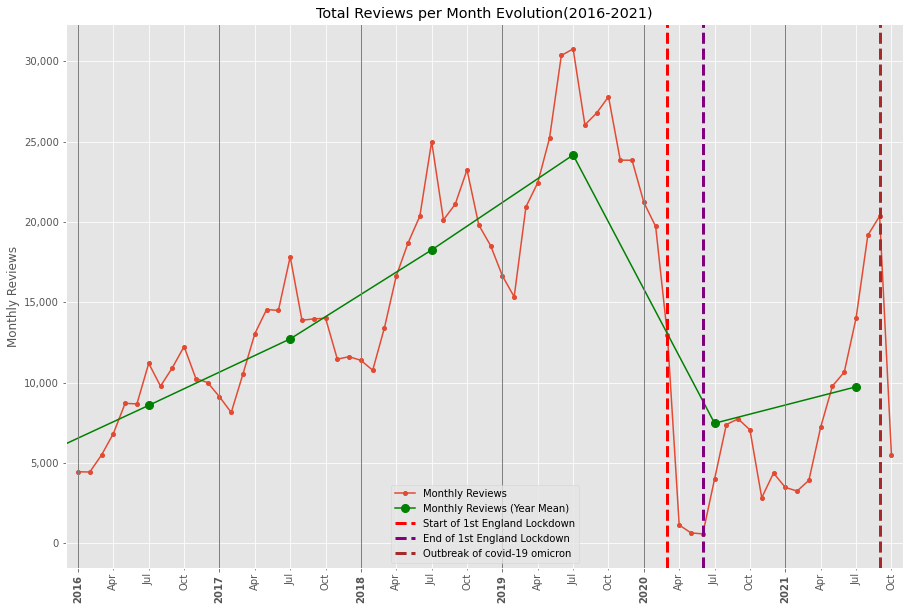

In [423]:
#Prepare x-axis dates
dates = pd.date_range(start='31-Jan-2016', end='31-Oct-2021', freq='3M')
dates = dates[dates.month!=1]
years = pd.to_datetime(list(range(2016,2022)), format='%Y')
years.strftime('%Y')

#Plot Total Reviews per Month Evolution
fig, ax = plt.subplots()
month_reviews_16_20 = month_reviews[month_reviews.index.year>=2016].copy()
month_reviews_16_20.plot(figsize=(15,10), marker='o', markersize=4, ax=ax, label='Monthly Reviews')
year_mean.plot(ax=ax, color='green', marker='o', markersize=8, label='Monthly Reviews (Year Mean)')
ax.axvline('20-March-2020', color='red', linestyle='--', label = 'Start of 1st England Lockdown', linewidth=3)
ax.axvline('1-June-2020', color='purple', linestyle='--', label = 'End of 1st England Lockdown', linewidth=3)
ax.axvline('30-Sep-2021', color='brown', linestyle='--', label = 'Outbreak of covid-19 omicron ', linewidth=3)

ax.set_xlim('Dec-2015','Nov-2021')
ax.set_xticks(years, minor=False)
ax.set_xticklabels(years.strftime('%Y'), rotation=90, minor=False, fontweight='bold')
ax.set_xticks(dates, minor=True)
ax.set_xticklabels(dates.strftime('%b'), rotation=90, minor=True)
ax.grid(which='minor')

for year in years:
    ax.axvline(year, linewidth=1, color='grey')

ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))    

ax.set_xlabel('')
ax.set_ylabel('Monthly Reviews')
ax.set_title('Total Reviews per Month Evolution(2016-2021)')
plt.legend();

# 10 市场规模
让我们分析一下每个社区的房源数量的变化：

In [326]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
# get errors about the first line being HTML!
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/visualisations/listings.csv'

# your code here
import pandas as pd
df2021 = pd.read_csv(url, low_memory=False)

print(f"Data frame is {df2021.shape[0]:,} x {df2021.shape[1]}")

Data frame is 67,903 x 18


In [327]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
# get errors about the first line being HTML!
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2020-12-16/visualisations/listings.csv'

# your code here
import pandas as pd
df2020 = pd.read_csv(url, low_memory=False)

print(f"Data frame is {df2020.shape[0]:,} x {df2020.shape[1]}")

Data frame is 77,136 x 16


In [328]:
#Drop listings with no reviews
df2021.dropna(subset=['last_review'], inplace=True)
df2020.dropna(subset=['last_review'], inplace=True)

In [329]:
df2020['last_review'] = pd.to_datetime(df2020['last_review'])

In [330]:
df2021['last_review'] = pd.to_datetime(df2021['last_review'])

In [331]:
list_act_19 = df2020[df2020['last_review'].dt.year==2019]
list_act_20 = df2021[df2021['last_review'].dt.year==2020]
list_act_21 = df2021[df2021['last_review'].dt.year==2021]

In [332]:
#Combine both datasets to make it easier to plot

data_19 = list_act_19[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_19['year']=2019
data_20 = list_act_20[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_20['year']=2020
data_21 = list_act_21[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_21['year']=2021


combined = pd.concat([data_19, data_20,data_21], ignore_index=True)

In [333]:
listing_types = pd.crosstab(index=combined['room_type'], columns=combined['year'])

In [334]:
blue="#30a2da"
red = "#fc4f30"
yellow = "#e5ae38"
green = "#6d904f"
grey = "#8b8b8b"

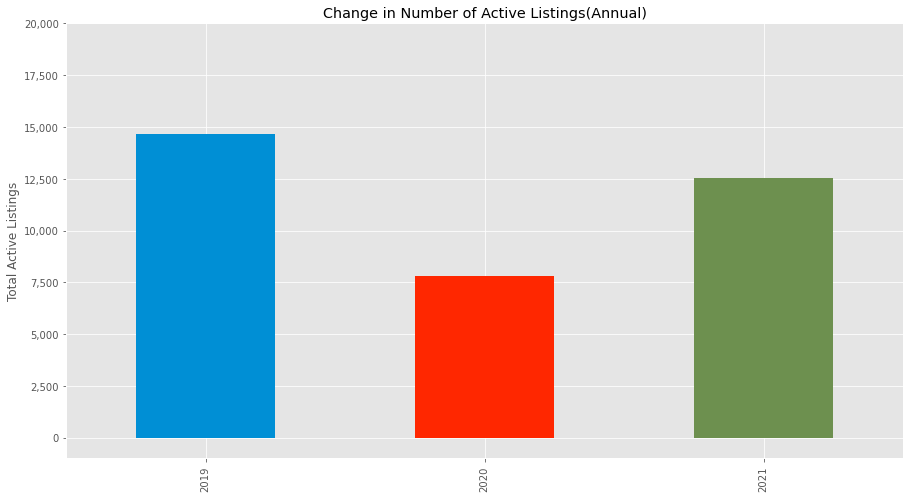

In [429]:
num_act_19 = len(list_act_19)
num_act_20 = len(list_act_20)
num_act_21 = len(list_act_21)

df_act = pd.Series({'2019':num_act_19,'2020':num_act_20, '2021':num_act_21})
fig,ax = plt.subplots(figsize=(15,8))
ax = df_act.plot.bar(color=[blue, red, green])
ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set_ylim(-1000,20000)
ax.set_xlabel('')
ax.set_ylabel('Total Active Listings')
ax.set_title('Change in Number of Active Listings(Annual)');

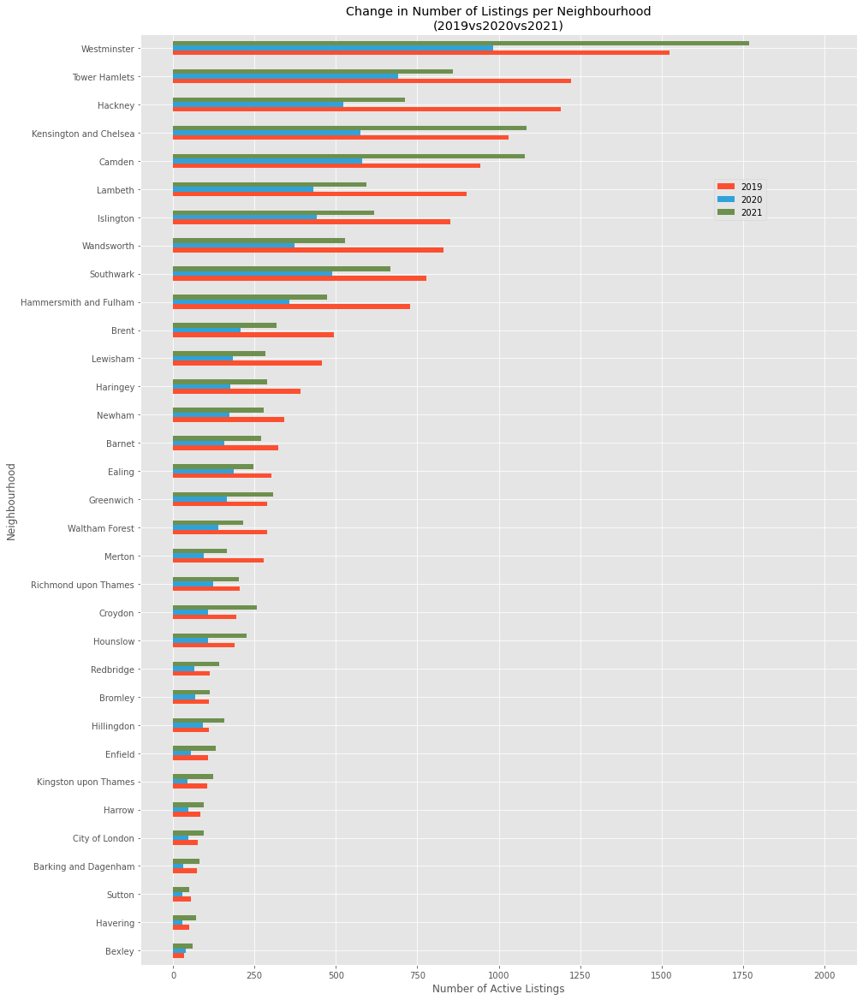

In [336]:
#Calculate the number of listings per neighbourhood
listings_nbd_year = pd.crosstab(index=combined['neighbourhood'], columns=combined['year'])
per_change = listings_nbd_year.apply(lambda row: (row.iloc[1]-row.iloc[0])/row.iloc[0], axis=1)
order = combined.loc[combined.year==2019, 'neighbourhood'].value_counts().sort_values(ascending=True).index
listings_nbd_year = listings_nbd_year.loc[order]
per_change = per_change.loc[order]

#Plot Change in Number of Listings per Neighbourhood
fig, ax = plt.subplots(figsize=(15,20))

listings_nbd_year[[2019,2020,2021]].plot.barh(ax=ax, color=[red,blue,green])
ax.set_xlabel('Number of Active Listings')
ax.set_ylabel('Neighbourhood')
ax.set_xlim(-100,2100)
ax.set_title('Change in Number of Listings per Neighbourhood\n(2019vs2020vs2021)')

    
ax.legend(loc=(0.8,0.8))
    
plt.show()

In [337]:
boros1 = boros.to_crs("epsg:4326")

In [427]:
nb_listings = list_act_21['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings'
          ).add_to(m_1)
m_1

In [428]:
nb_listings = list_act_21['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings'
          ).add_to(m_1)
m_1

In [430]:
nb_listings = list_act_19['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings(2019)'
          ).add_to(m_1)
m_1

# 9 Sentiment Analysis using VADER

VADER Sentiment Analysis :

VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media. VADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labeled according to their semantic orientation as either positive or negative. VADER not only tells about the Positivity and Negativity score but also tells us about how positive or negative a sentiment is.

It is primarily used to measure changes in people's sentiment towards listings on airbnb between years.

You can tell the quality of service on the Airbnb platform from the results.

##  9.1 library Special packages

In [341]:
from wordcloud import WordCloud, STOPWORDS
from sklearn.preprocessing import OneHotEncoder # We don't use this but I point out where you *could*
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import string
import nltk
import spacy
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer

from nltk.corpus import stopwords
stopword_list = set(stopwords.words('english'))

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.tokenize.toktok import ToktokTokenizer
#from nltk.tokenize.stanford import StanfordTokenizer

from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

from nltk import ngrams, FreqDist

lemmatizer = WordNetLemmatizer()
tokenizer = ToktokTokenizer()

[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [342]:
# Sentiment Analysis
# load the SentimentIntensityAnalyser object in
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import nltk
nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [343]:
# use the polarity_scores() method to get the sentiment metrics
def print_sentiment_scores(sentence):
    snt = analyzer.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(snt)))

In [344]:
# the compound score
def compound_score(text):
    compound_value = analyzer.polarity_scores(text)['compound']

## 9.2 load the review data

In [345]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/reviews.csv.gz'

# your code here
import pandas as pd
reviews = pd.read_csv(url,compression='gzip' ,low_memory=False)

print(f"Data frame is {reviews.shape[0]:,} x {reviews.shape[1]}")

Data frame is 1,048,405 x 6


In [346]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048405 entries, 0 to 1048404
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   listing_id     1048405 non-null  int64 
 1   id             1048405 non-null  int64 
 2   date           1048405 non-null  object
 3   reviewer_id    1048405 non-null  int64 
 4   reviewer_name  1048404 non-null  object
 5   comments       1047924 non-null  object
dtypes: int64(3), object(3)
memory usage: 48.0+ MB


## 9.3 link the data

In [347]:
df2021 = pd.read_csv(os.path.join('data','clean','listings.csv.gz'),compression='gzip', low_memory=False)

In [348]:
df_merge = pd.merge(reviews, df2021[['neighbourhood_cleansed', 'host_id', 'latitude',
                          'longitude', 'number_of_reviews', 'id', 'property_type']], 
              left_on='listing_id', right_on='id', how='left')


df_merge.drop(['id_y'], axis=1, inplace=True)

In [349]:
print("The dataset has {} rows and {} columns.".format(*df_merge.shape))

The dataset has 1048405 rows and 12 columns.


In [350]:
df_merge.drop(index=(df_merge[(df_merge.comments.isna()) | 
                  (df_merge.neighbourhood_cleansed.isna()) |
                  (df_merge.reviewer_name.isna())].index), inplace=True)
print(df_merge.shape)

(1047913, 12)


In [351]:
# check missing data
df_merge.isna().sum()

listing_id                0
id_x                      0
date                      0
reviewer_id               0
reviewer_name             0
comments                  0
neighbourhood_cleansed    0
host_id                   0
latitude                  0
longitude                 0
number_of_reviews         0
property_type             0
dtype: int64

In [352]:
# remove them
df_merge.dropna(inplace=True)
df_merge.isna().sum()
print(df_merge.shape)

(1047913, 12)


## 9.4 Wordcloud

In [417]:
# remove punctuation
pattern = re.compile(r'[,\.!\-><=\(\)\[\]\/&\'\"’;]+')
punkt   = []
for c in df_merge:
    punkt.append(re.sub(pattern, ' ', c))

In [418]:
# Removing Stopword
from nltk.corpus import stopwords
stopword_list = set(stopwords.words('english'))
stopped = []
for p in punkt:
    stopped.append(' '.join([x for x in re.split(r'\s+', p) if x not in stopword_list]))

In [419]:
# Removing html
from bs4 import BeautifulSoup
cleaned = []
for l in df_merge:
    tmp = re.sub(r'(\/[A-Za-z]+\d?|[A-Za-z]+ \/)>','\\1> ', l)
    soup = BeautifulSoup(tmp, "html.parser")
    if not re.match(r'^\s*$',soup.get_text()):
        cleaned.append(soup.get_text())

In [420]:
# Visualizing the Data with WordClouds
# import other necessary libraries
from collections import Counter
from PIL import Image

In [421]:
# wrap the plotting in a function for easier access
def plot_wordcloud(wordcloud, language):
    plt.figure(figsize=(12, 10))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off")
    plt.title(language + ' Comments\n', fontsize=18, fontweight='bold')
    plt.show()

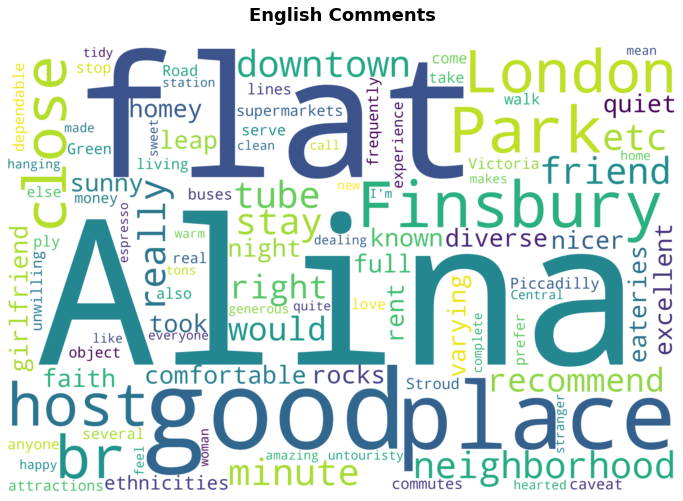

In [422]:
wordcloud = WordCloud(max_font_size=None, max_words=100, background_color="White", 
                      width=3000, height=2000,
                      stopwords=stopwords.words('english','german')).generate(str(df_merge.comments.values))

plot_wordcloud(wordcloud, "English")

## 9.5 Use semantic segmentation to score comments

In [358]:
# Sentiment Analysis
# load the SentimentIntensityAnalyser object in
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import nltk
nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [359]:
# use the polarity_scores() method to get the sentiment metrics
def print_sentiment_scores(sentence):
    snt = analyzer.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(snt)))

In [360]:
# getting only the compound score
def compound_score(text):
    compound_value = analyzer.polarity_scores(text)['compound']
    return compound_value

In [361]:
df_merge['year'] = pd.DatetimeIndex(df_merge['date']).year

In [362]:
df_merge_2019=df_merge[df_merge['year']==2019]
df_merge_2020=df_merge[df_merge['year']==2020]
df_merge_2021=df_merge[df_merge['year']==2021]

#### Random adoption of three years of data to reduce the number of calculations  

In [363]:
df_merge_2019_sample = df_merge_2019.sample(frac=0.06)
df_merge_2020_sample = df_merge_2020.sample(frac=0.2)
df_merge_2021_sample = df_merge_2021.sample(frac=0.2)
print(df_merge_2019_sample.shape)
print(df_merge_2020_sample.shape)
print(df_merge_2021_sample.shape)

(17392, 13)
(17898, 13)
(19444, 13)


In [364]:
#it may spend 10 mins to run the conde or less
#2019
df_merge_2019_sample['sentiment_compound'] = df_merge_2019_sample['comments'].apply(compound_score)
#2020
df_merge_2020_sample['sentiment_compound'] = df_merge_2020_sample['comments'].apply(compound_score)
#2021
df_merge_2021_sample['sentiment_compound'] = df_merge_2021_sample['comments'].apply(compound_score)

In [365]:
#2019 comments class
good2019 = df_merge_2019_sample[df_merge_2019_sample['sentiment_compound']> 0.05].count()
bad2019  = df_merge_2019_sample[df_merge_2019_sample['sentiment_compound']<-0.05].count()
net2019  = df_merge_2019_sample[(df_merge_2019_sample['sentiment_compound']>-0.05)&(df_merge_2019_sample['sentiment_compound']<0.05)].count()

In [366]:
#2020 comments class
good2020 = df_merge_2020_sample[df_merge_2020_sample['sentiment_compound']> 0.05].count()
bad2020  = df_merge_2020_sample[df_merge_2020_sample['sentiment_compound']<-0.05].count()
net2020  = df_merge_2020_sample[(df_merge_2020_sample['sentiment_compound']>-0.05)&(df_merge_2020_sample['sentiment_compound']<0.05)].count()

In [367]:
#2021 comments class
good2021 = df_merge_2021_sample[df_merge_2021_sample['sentiment_compound']> 0.05].count()
bad2021  = df_merge_2021_sample[df_merge_2021_sample['sentiment_compound']<-0.05].count()
net2021  = df_merge_2021_sample[(df_merge_2021_sample['sentiment_compound']>-0.05)&(df_merge_2021_sample['sentiment_compound']<0.05)].count()

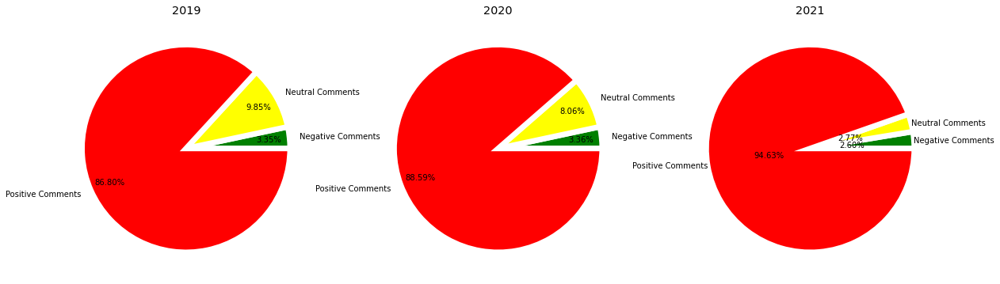

In [463]:
# Comparing Negative and Positive Comments
# assign the data
neg2019 = bad2019[1]
mid2019 = net2019[1]
pos2019 = good2019 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2019 = [neg2019, mid2019, pos2019]

#2020
neg2020 = bad2020[1]
mid2020 = net2020[1]
pos2020 = good2020 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2020 = [neg2020, mid2020, pos2020]

# 2021
neg2021 = bad2021[1]
mid2021 = net2021[1]
pos2021 = good2021 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2021 = [neg2021, mid2021, pos2021]

# call a pie chart
plt.subplot(1,3,1)
plt.pie(size2019, labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.8,labeldistance=1.1,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })
plt.title('2019')

#fig.set_size_inches(20,15)
plt.savefig('data/raw/comparing2019.png')

plt.subplot(1,3,2)
plt.pie(size2020, labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.8,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })
plt.title('2020')
#fig.set_size_inches(20,15)
plt.savefig('data/raw/comparing2020.png')

plt.subplot(1,3,3)

plt.pie(size2021,labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.4,labeldistance=1,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })

plt.title('2021')



plt.savefig('data/raw/comparing2021.png')

# plot the donut chart
fig = plt.gcf()
fig.set_size_inches(20,20)
#fig.gca().add_artist(my_circle)
plt.show()

# 10 Airbnb的房源是否因为大流行而下滑？

## 10.1 load the london shapefile

In [369]:
import os
from requests import get
from urllib.parse import urlparse

def cache_data(src:str, dest:str) -> str:
    """Downloads and caches a remote file locally.
    
    The function sits between the 'read' step of a pandas or geopandas
    data frame and downloading the file from a remote location. The idea
    is that it will save it locally so that you don't need to remember to
    do so yourself. Subsequent re-reads of the file will return instantly
    rather than downloading the entire file for a second or n-th itme.
    
    Parameters
    ----------
    src : str
        The remote *source* for the file, any valid URL should work.
    dest : str
        The *destination* location to save the downloaded file.
        
    Returns
    -------
    str
        A string representing the local location of the file.
    """
    
    url = urlparse(src) # We assume that this is some kind of valid URL 
    fn  = os.path.split(url.path)[-1] # Extract the filename
    dfn = os.path.join(dest,fn) # Destination filename
    
    # Check if dest+filename does *not* exist -- 
    # that would mean we have to download it!
    if not os.path.isfile(dfn):
        
        print(f"{dfn} not found, downloading!")
        
        # Convert the path back into a list (without)
        # the filename -- we need to check that directories
        # exist first.
        path = os.path.split(dest)
        
        # Create any missing directories in dest(ination) path
        # -- os.path.join is the reverse of split (as you saw above)
        # but it doesn't work with lists... so I had to google how
        # to use the 'splat' operator! os.makedirs creates missing
        # directories in a path automatically.
        if len(path) >= 1 and path[0] != '':
            os.makedirs(os.path.join(*path), exist_ok=True)
        
        # Download and write the file
        with open(dfn, "wb") as file:
            response = get(src)
            file.write(response.content)
            
        print("\tDone downloading...")

    else:
        print(f"Found {dfn} locally!")

    return dfn

In [370]:
ddir  = os.path.join('data','geo') # destination directory (in case it is not found this directory is created)
spath = 'https://github.com/jreades/i2p/blob/master/data/src/' # source path

boros = gpd.read_file( cache_data(spath+'Boroughs.gpkg?raw=true', ddir) )

Found data/geo/Boroughs.gpkg locally!


/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [373]:
scores = ['neighbourhood_cleansed','review_scores_rating','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
         'review_scores_location','review_scores_value','id','latitude','longitude']

In [374]:
df_score = df2021[scores]

In [467]:
len(df_score.review_scores_value>0)

48872

In [375]:
df_score_groupby = df_score.groupby('neighbourhood_cleansed').mean()

In [376]:
df_score_groupby

,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,id,latitude,longitude
neighbourhood_cleansed,,,,,,,,,
Barking and Dagenham,4.362638,4.563964,4.761577,4.744144,4.504324,4.613559,3.321419e+07,51.543429,0.118748
Barnet,4.480784,4.617080,4.792028,4.799121,4.679667,4.628552,2.760567e+07,51.596587,-0.206185
Bexley,4.567485,4.634167,4.796287,4.793869,4.653054,4.645269,3.157095e+07,51.469494,0.136592
Brent,4.522060,4.660571,4.807616,4.813298,4.647768,4.638446,2.556209e+07,51.546313,-0.236376
Bromley,4.575638,4.609482,4.771865,4.789326,4.676943,4.641114,2.746733e+07,51.398959,-0.000468
Camden,4.512855,4.578772,4.762553,4.766933,4.827539,4.576404,2.676176e+07,51.537097,-0.146468
City of London,4.573468,4.652041,4.774057,4.752295,4.833566,4.596393,2.824518e+07,51.514878,-0.090166
Croydon,4.505663,4.648088,4.792411,4.794351,4.625250,4.656362,3.039482e+07,51.382994,-0.096078
Ealing,4.560685,4.655328,4.832740,4.823425,4.697705,4.670761,2.519001e+07,51.513414,-0.297924


In [377]:
df_score_groupby.reset_index(inplace=True)

In [379]:
df_vis=pd.merge(boros,df_score_groupby,left_on='NAME',right_on='neighbourhood_cleansed')

In [380]:
df_vis.sort_values('review_scores_value',axis=0,ascending=False)

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,geometry,neighbourhood_cleansed,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,id,latitude,longitude
0,Kingston upon Thames,E09000021,3726.117,0.000,F,"MULTIPOLYGON (((516401.600 160201.800, 516407....",Kingston upon Thames,4.668324,4.715128,4.865442,4.868262,4.780912,4.725128,2.743579e+07,51.404107,-0.286609
5,Havering,E09000016,11445.735,210.763,F,"MULTIPOLYGON (((549893.900 181459.800, 549894....",Havering,4.625480,4.667457,4.859709,4.845607,4.733140,4.722791,3.183417e+07,51.570663,0.196537
19,Richmond upon Thames,E09000027,5876.111,135.443,F,"MULTIPOLYGON (((516677.500 175383.800, 516678....",Richmond upon Thames,4.597977,4.710826,4.872141,4.872992,4.848881,4.706818,2.379593e+07,51.453162,-0.307190
12,Lewisham,E09000023,3531.706,16.795,T,"MULTIPOLYGON (((536691.000 178958.600, 536691....",Lewisham,4.554075,4.649806,4.831649,4.846679,4.654456,4.704010,2.476468e+07,51.457907,-0.028706
10,Lambeth,E09000022,2724.940,43.927,T,"MULTIPOLYGON (((530046.800 177893.400, 530048....",Lambeth,4.577642,4.659359,4.828961,4.849647,4.754278,4.703131,2.374763e+07,51.463897,-0.119152
16,Waltham Forest,E09000031,3880.793,0.000,F,"MULTIPOLYGON (((539923.100 191863.100, 539928....",Waltham Forest,4.593596,4.634138,4.831465,4.851442,4.664420,4.701887,2.578348e+07,51.578355,-0.012871
28,Hackney,E09000012,1904.902,0.000,T,"MULTIPOLYGON (((531928.400 187801.500, 531935....",Hackney,4.602109,4.639660,4.835867,4.864886,4.764072,4.697728,2.242452e+07,51.545755,-0.068661
21,Wandsworth,E09000032,3522.022,95.600,T,"MULTIPOLYGON (((523489.600 176224.800, 523500....",Wandsworth,4.540244,4.689803,4.830259,4.840370,4.762679,4.692198,2.507759e+07,51.455999,-0.177485
15,Enfield,E09000010,8220.025,0.000,F,"MULTIPOLYGON (((531023.500 200933.600, 531039....",Enfield,4.568651,4.685918,4.821589,4.840055,4.670082,4.681890,2.757123e+07,51.633966,-0.086737
4,Ealing,E09000009,5554.428,0.000,F,"MULTIPOLYGON (((510253.500 182881.600, 510249....",Ealing,4.560685,4.655328,4.832740,4.823425,4.697705,4.670761,2.519001e+07,51.513414,-0.297924


The mean and median of the score are 4.65 and 4.65


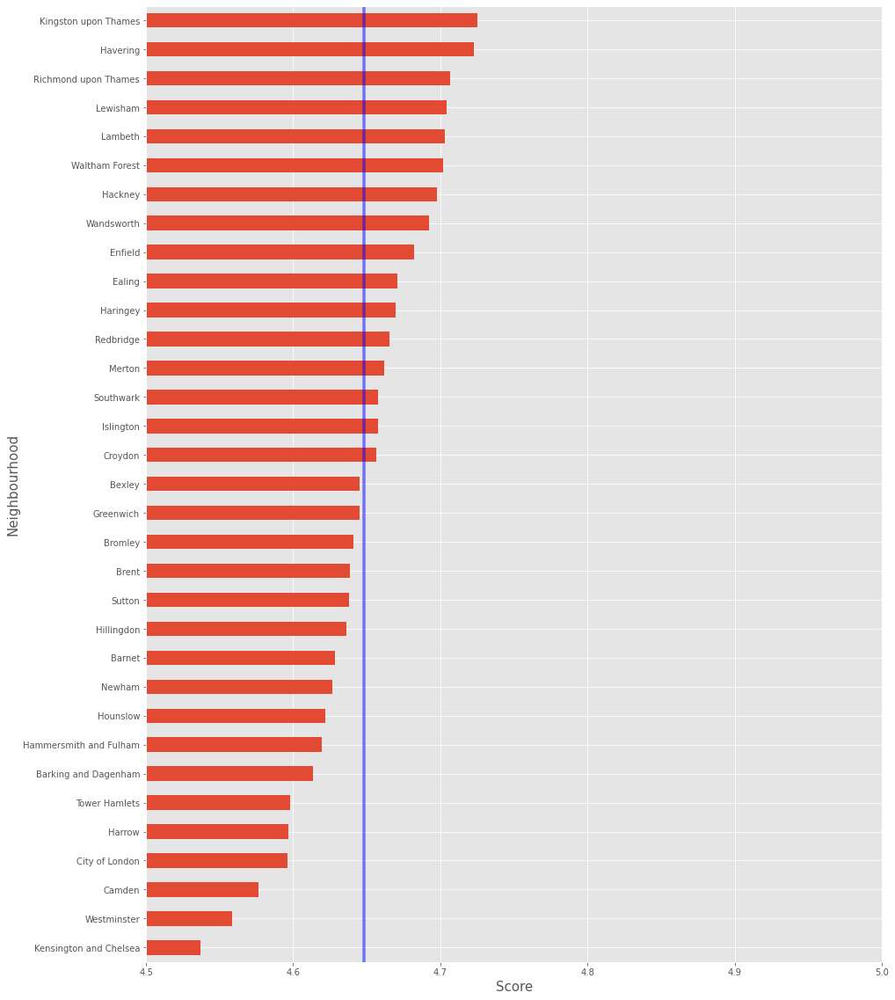

In [478]:
print(f"The mean and median of the score are {df_vis.review_scores_value.mean():,.2f} and {df_vis.review_scores_value.median():,.2f}")
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15,20))
df_vis1 = df_vis.set_index('NAME')
df_vis1.sort_values('review_scores_value',inplace=True)
df_vis1['review_scores_value'].plot.barh(ax=ax)
ax.set_xlim(4.5,5)
ax.set_ylabel('Neighbourhood',fontsize=15)
ax.set_xlabel('Score',fontsize=15)
ax.axvline(df_vis.review_scores_value.mean(), color='blue', linewidth=3.5,alpha=0.5)
plt.show()

In [477]:
import json
from bokeh.plotting import figure
from bokeh.tile_providers import CARTODBPOSITRON, get_provider

from bokeh.io import output_file, show, output_notebook, push_notebook, export_png
from bokeh.models import ColumnDataSource, GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool
from bokeh.plotting import figure
from bokeh.palettes import brewer

output_notebook()

Loading BokehJS ...

In [383]:
def get_geodatasource(gdf):    
    """Get getjsondatasource from geopandas object"""
    json_data = json.dumps(json.loads(gdf.to_json()))
    return GeoJSONDataSource(geojson = json_data)

def bokeh_plot_map(gdf, column=None, title=''):
    """Plot bokeh map from GeoJSONDataSource """
    
    tile_provider = get_provider(CARTODBPOSITRON)

    geosource = get_geodatasource(gdf)
    palette = brewer['OrRd'][8]
    palette = palette[::-1]
    vals = gdf[column]
    
    #Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette=palette, low=vals.min(), high=vals.max())
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=10,
                         location=(0,0), orientation='horizontal')

    tools = 'wheel_zoom,pan,reset,hover'
    
    p = figure(title = title, plot_height=700, plot_width=850, toolbar_location='right', tools=tools)
    p.add_tile(tile_provider)
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    # Add patch renderer to figure
    p.patches('xs','ys', source=geosource, fill_alpha=0.5, line_width=0.5, line_color='white',  
              fill_color={'field' :column , 'transform': color_mapper})
    
    # Specify figure layout.
    p.add_layout(color_bar, 'below')
    
    # Add hover
    hover = p.select_one(HoverTool)
    hover.point_policy = "follow_mouse"
    hover.tooltips = [("Name", "@NAME"),
                      ("Score", "@review_scores_value")]
    
    return p

In [384]:
p = bokeh_plot_map(df_vis, 'review_scores_value', title='Score in London')

handle = show(p, notebook_handle=True)
push_notebook(handle=handle)

# 三年的总体变化

In [385]:
scores = ['neighbourhood_cleansed','review_scores_rating','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
         'review_scores_location','review_scores_value','id','latitude','longitude','last_review']

In [386]:
df_score_sum = df2021[scores]

In [387]:
df_score_sum['year'] = pd.DatetimeIndex(df_score_sum['last_review']).year

/opt/conda/envs/sds2021/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


In [388]:
df_score_sum_2019=df_score_sum[df_score_sum['year']==2019]
df_score_sum_2020=df_score_sum[df_score_sum['year']==2020]
df_score_sum_2021=df_score_sum[df_score_sum['year']==2021]

In [390]:
score_sum

2019    4.653256
2020    4.656078
2021    4.606759
dtype: float64

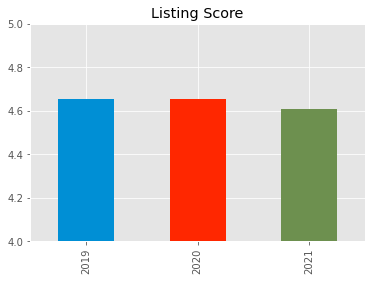

In [480]:
blue='#008FD5'
red = '#FF2700'
green = "#6d904f"
score_sum = pd.Series({2019:df_score_sum_2019.review_scores_value.mean(),2020:df_score_sum_2020.review_scores_value.mean(),2021:df_score_sum_2021.review_scores_value.mean()})
ax = score_sum .plot.bar(color=[blue, red, green])
ax.set_ylim(4.00,5.000)
ax.set_title('Listing Score')
plt.show()

In [391]:
score_sum_year = pd.DataFrame(score_sum)

In [392]:
score_sum_year.columns = ['score']
score_sum_year

,score
2019,4.653256
2020,4.656078
2021,4.606759
